In [1]:
import shutil
from collections import defaultdict
from pathlib import Path
from typing import Callable, List, Tuple, Dict

import cv2
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from matplotlib.axes import Axes
from tqdm.notebook import tqdm

import utils

In [2]:
% matplotlib inline
% load_ext autoreload
% autoreload 2

In [3]:
plt.rcParams['figure.dpi'] = 120
plt.rcParams['savefig.dpi'] = 300
sns.set_theme()

In [4]:
# ---- Path

DATA_DIR = Path('data')
DATA_VIDEOS = DATA_DIR / 'videos'
DATA_IMAGES = DATA_DIR / 'images'
DATA_LABELS = DATA_DIR / 'labels'
DATA_CROP = DATA_DIR / 'crop'
DATA_OTHER = DATA_DIR / 'other'
DATA_PROBLEMS = DATA_OTHER / 'problems.txt'

DIST_DIR = Path('dist')
DIST_LABELS = DIST_DIR / 'labels'
DIST_LABELS_HAND = DIST_LABELS / 'hand'
DIST_LABELS_YOLO = DIST_LABELS / 'yolo'
DIST_MODELS = DIST_DIR / 'models'

# ---- Image

IMG_SIZE_ORIG = 720
IMG_SIZE_YOLO = 416

DATA_IMAGES_ORIG = DATA_IMAGES / str(IMG_SIZE_ORIG)
DATA_IMAGES_YOLO = DATA_IMAGES / str(IMG_SIZE_YOLO)

# ---- Domain

MOBS = ['zombie', 'skeleton', 'spider', 'creeper', 'enderman', 'slime']
BIOMES = [
    'plains_0', 'plains_1',
    'savanna_0', 'savanna_1',
    'desert_0', 'desert_1',
    'snowy_0', 'snowy_1',
    'cave',
]

# ---- Utils

RANDOM = np.random.default_rng(0)
COLOR_PALETTE = utils.ColorPalette([
    (8, 247, 254),
    (254, 83, 187),
    (238, 66, 102),
    (255, 210, 63),
    (59, 206, 172),
    (14, 173, 105),
], MOBS)

FIG_WIDTH_S = 6
FIG_WIDTH_M = 8
FIG_WIDTH_L = 10
FIG_WIDTH_XL = 12
FIG_WIDTH_XXL = 14

# ---- Mosaic

MOSAIC_3 = utils.Mosaic("""
    AAB
    AAC
""")

MOSAIC_13 = utils.Mosaic("""
    ABEEFF
    CDEEFF
    GGGGHH
    GGGGHH
    GGGGKL
    MMNNPP
    MMNNPP
""")

MOSAIC_27 = utils.Mosaic("""
    AABBCDEFGH
    AABBIIIIII
    JJJJIIIIII
    JJJJIIIIII
    JJJJIIIIII
    JJJJIIIIII
    KKLMIIIIII
    KKNOPPPQQR
    XYWWPPPQQS
    Z0WWPPPTUV
""")

# Создание датасета

## Сбор данных

In [11]:
def video2frames(path: Path, save_dir: Path, name: str):
    vidcap = cv2.VideoCapture(str(path))
    ok, img = vidcap.read()
    cnt = 0
    while ok:
        cv2.imwrite(str(save_dir / f'{name}_{cnt:02}.jpg'), img[:, 75:img.shape[0] + 75])
        cnt += 1
        vidcap.set(cv2.CAP_PROP_POS_MSEC, (cnt * 500))
        ok, img = vidcap.read()


def create_images_from_videos(video_path: Path, image_path: Path):
    """Создает картинки для всех групп мобов из соответствующих видео"""
    for i, mob in enumerate(tqdm(MOBS)):
        mob_ = f'{i:02}_{mob}'
        for j, biome in enumerate(tqdm(BIOMES)):
            biome_ = f'{j:02}_{biome}'
            video2frames(video_path / mob_ / f'{biome_}.mkv', image_path, f'{mob_}_{biome_}')


In [21]:
create_images_from_videos(DATA_VIDEOS, DATA_IMAGES_ORIG)

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

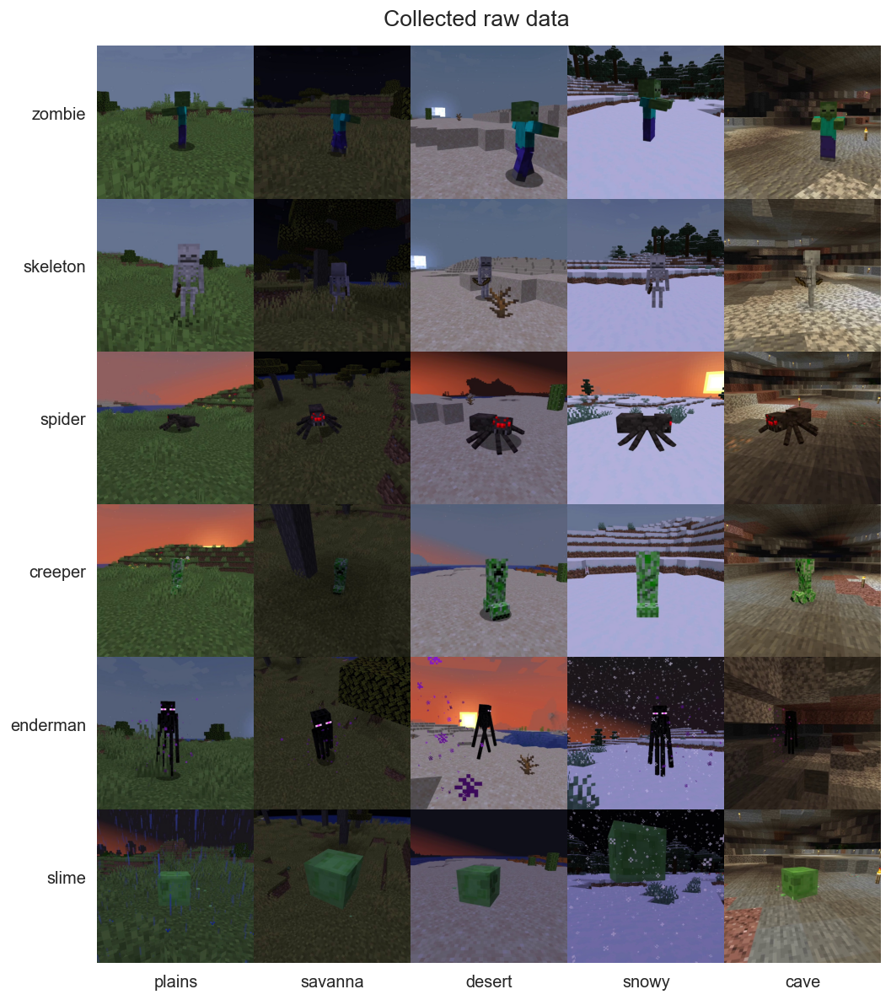

In [77]:
biomes_sample = [
    '00_plains_0_01.jpg',
    '03_savanna_1_25.jpg',
    '04_desert_0_12.jpg',
    '06_snowy_0_01.jpg',
    '08_cave_08.jpg'
]
biomes_sample_names = [i.split('_')[1] for i in biomes_sample]
images_sample = []
for i, mob in enumerate(MOBS):
    mob_ = f'{i:02}_{mob}'
    for biome in biomes_sample:
        path = DATA_IMAGES_ORIG / f'{mob_}_{biome}'
        images_sample.append(utils.Image.open(path).data)

nrows, ncols = 6, 5
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(FIG_WIDTH_L, FIG_WIDTH_L / (ncols / nrows)))
fig.subplots_adjust(hspace=0.00, wspace=0.00)
fig.suptitle('Collected raw data', y=0.91)
for i, image in enumerate(images_sample):
    row = i // ncols
    col = i % ncols
    ax = axes[row, col]
    utils.reset_axes(ax)

    if col == 0:
        ax.set_ylabel(MOBS[row], rotation=0, labelpad=8, horizontalalignment='right', size=12)
    if row == nrows - 1:
        ax.set_xlabel(biomes_sample_names[col], labelpad=8, size=12)

    ax.imshow(image, aspect='auto')

del images_sample

## Подготовка данных для обучения модели

In [62]:
def resize_images(orig_dir: Path, resize_dir: Path, size: int):
    for img_path in tqdm(list(orig_dir.iterdir())):
        img = utils.Image.open(img_path)
        img.data = cv2.resize(img.data, (size, size))
        img.save(resize_dir / img_path.name)


def sample_for_labeling(images_dir: Path, labels_dir: Path, use_fixed: bool = False):
    """Выбирает случайный набор изображений для создания ручной разметки"""

    target_dir = labels_dir / 'images'
    shutil.rmtree(target_dir, ignore_errors=True)
    target_dir.mkdir()

    if use_fixed:
        fixed_dir = labels_dir / '.fixed'
        for f in (fixed_dir / 'images').iterdir():
            shutil.copy(f, target_dir)

        _labels = labels_dir / 'labels'
        shutil.rmtree(_labels, ignore_errors=True)
        _labels.mkdir()
        for f in (fixed_dir / 'labels').iterdir():
            shutil.copy(f, _labels)

    else:
        images = defaultdict(list)
        for f in images_dir.iterdir():
            mob = f.name.split('_')[1]
            images[mob].append(f)

        for files in images.values():
            for f in np.sort(RANDOM.choice(files, size=40, replace=False)):
                shutil.copy(f, target_dir)


def create_dataset_for_yolo(labels_dir: Path, dataset_dir: Path):
    """Создает датасет из размеченных данных для обучения YOLOv5"""

    def train_augment(
            img: np.ndarray,
            cls: int,
            bbox: utils.BBox
    ) -> List[Tuple[np.ndarray, int, utils.BBox, str]]:
        orig = (img, cls, bbox)
        orig_pos_rotated = utils.transform(utils.a_rotate(10), *orig)
        orig_neg_rotated = utils.transform(utils.a_rotate(-10), *orig)
        orig_pos_pos_shear = utils.transform(utils.a_shear(12, 12), *orig)
        orig_neg_pos_shear = utils.transform(utils.a_shear(-12, 12), *orig)
        orig_pos_neg_shear = utils.transform(utils.a_shear(12, -12), *orig)
        orig_neg_neg_shear = utils.transform(utils.a_shear(-12, -12), *orig)

        flipped = utils.transform(utils.a_horizontal_flip(), *orig)
        flipped_pos_rotated = utils.transform(utils.a_rotate(10), *flipped)
        flipped_neg_rotated = utils.transform(utils.a_rotate(-10), *flipped)
        flipped_pos_pos_shear = utils.transform(utils.a_shear(12, 12), *flipped)
        flipped_neg_pos_shear = utils.transform(utils.a_shear(-12, 12), *flipped)
        flipped_pos_neg_shear = utils.transform(utils.a_shear(12, -12), *flipped)
        flipped_neg_neg_shear = utils.transform(utils.a_shear(-12, -12), *flipped)

        return [
            (*orig, ''),
            (*orig_pos_rotated, 'pos_rotated'),
            (*orig_neg_rotated, 'neg_rotated'),
            (*orig_pos_pos_shear, 'pos_pos_shear'),
            (*orig_neg_pos_shear, 'neg_pos_shear'),
            (*orig_pos_neg_shear, 'pos_neg_shear'),
            (*orig_neg_neg_shear, 'neg_neg_shear'),

            (*flipped, 'flip'),
            (*flipped_pos_rotated, 'flip_pos_rotated'),
            (*flipped_neg_rotated, 'flip_neg_rotated'),
            (*flipped_pos_pos_shear, 'pos_pos_shear'),
            (*flipped_neg_pos_shear, 'neg_pos_shear'),
            (*flipped_pos_neg_shear, 'pos_neg_shear'),
            (*flipped_neg_neg_shear, 'neg_neg_shear'),
        ]

    def test_augment(
            img: np.ndarray,
            cls: int,
            bbox: utils.BBox
    ) -> List[Tuple[np.ndarray, int, utils.BBox, str]]:
        orig = (img, cls, bbox)
        flipped = utils.transform(utils.a_horizontal_flip(), *orig)
        return [(*orig, ''), (*flipped, 'flip')]  # type: ignore

    def save_augment(
            augment: Callable[[np.ndarray, int, utils.BBox], List[Tuple[np.ndarray, int, utils.BBox, str]]],
            images: List[Path],
            labels: List[Path],
            name: str
    ):
        images_dir = dataset_dir / name / 'images'
        images_dir.mkdir(exist_ok=True, parents=True)
        labels_dir = dataset_dir / name / 'labels'
        labels_dir.mkdir(exist_ok=True, parents=True)
        for img_path, label_path in zip(images, labels):
            img = utils.Image.open(img_path)
            label = utils.Label.open(label_path)
            augments = augment(img.data, label.cls, label.bbox)
            for data, cls, bbox, name in augments:
                utils.Image(data).save(images_dir / f'{"_".join([img_path.stem, name])}.jpg')
                utils.Label(cls, bbox).save(labels_dir / f'{"_".join([label_path.stem, name])}.txt')

    by_mobs = defaultdict(list)
    for img, label in zip((labels_dir / 'images').iterdir(), (labels_dir / 'labels').iterdir()):
        mob = img.name.split('_')[1]
        by_mobs[mob].append((img, label))

    for mob, images_labels in tqdm(by_mobs.items()):
        images, labels = zip(*images_labels)
        images_train, images_valid, images_test, labels_train, labels_valid, labels_test = utils.train_valid_test_split(
            images,
            labels,
            train_size=0.8,
            valid_size=0.1,
            random_state=0,
        )

        save_augment(train_augment, images_train, labels_train, 'train')
        save_augment(test_augment, images_valid, labels_valid, 'valid')
        save_augment(test_augment, images_test, labels_test, 'test')

    colab_root = Path('/content')
    train_data_path = str((colab_root / dataset_dir / 'train/images').as_posix())
    valid_data_path = str((colab_root / dataset_dir / 'valid/images').as_posix())
    test_data_path = str((colab_root / dataset_dir / 'test/images').as_posix())

    data = {
        'names': MOBS,
        'nc': len(MOBS),
        'train': train_data_path,
        'val': valid_data_path,
        'test': test_data_path,
    }
    utils.write_yaml(dataset_dir / 'data.yaml', data)

    only_train_path = [train_data_path, valid_data_path, test_data_path]
    only_train_data = {
        'names': MOBS,
        'nc': len(MOBS),
        'train': only_train_path,
        'val': only_train_path,
    }
    utils.write_yaml(dataset_dir / 'only_train_data.yaml', only_train_data)


In [38]:
resize_images(DATA_IMAGES_ORIG, DATA_IMAGES_YOLO, size=IMG_SIZE_YOLO)

  0%|          | 0/3787 [00:00<?, ?it/s]

In [64]:
sample_for_labeling(DATA_IMAGES_YOLO, DIST_LABELS_HAND, use_fixed=True)

In [65]:
% % capture

!.\venv39\Scripts\activate
!labelImg dist\labels\hand\images dist\labels\hand\labels\classes.txt dist\labels\hand\labels
!.\venv\Scripts\activate

In [66]:
create_dataset_for_yolo(DIST_LABELS_HAND, DIST_LABELS_YOLO)

  0%|          | 0/6 [00:00<?, ?it/s]

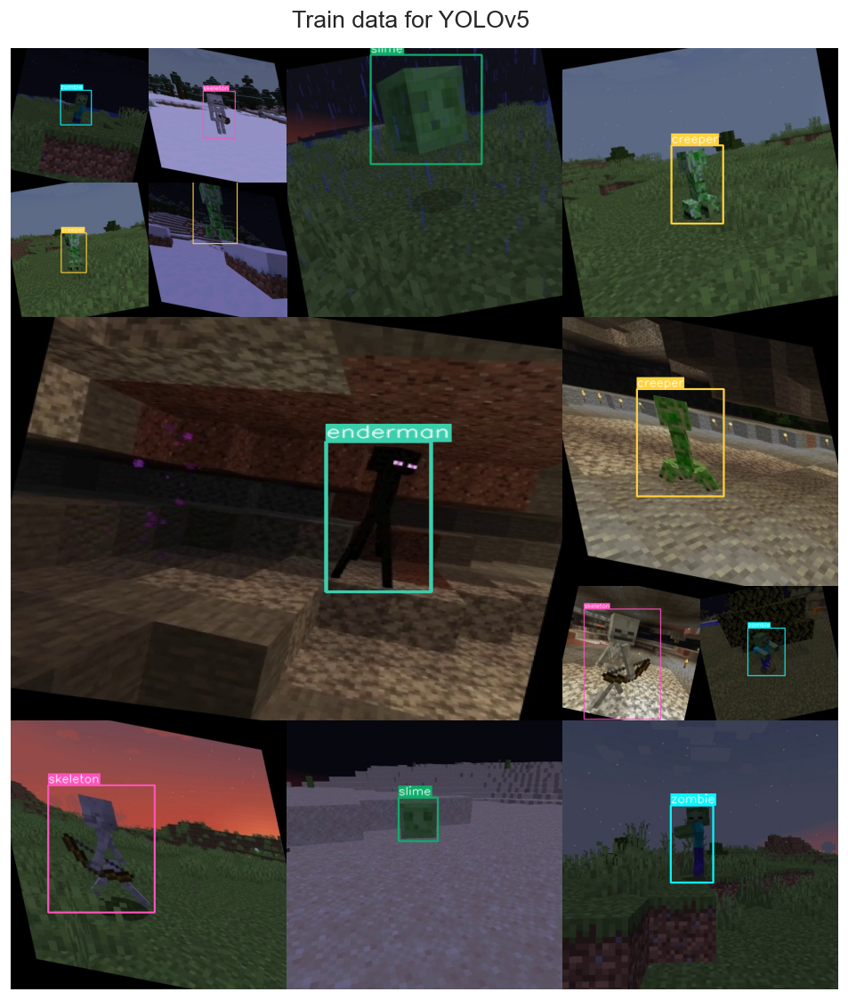

In [78]:
yolo_images_sample = sorted((DIST_LABELS_YOLO / 'train' / 'images').iterdir())
yolo_labels_sample = sorted((DIST_LABELS_YOLO / 'train' / 'labels').iterdir())
yolo_mobs_sample = [f.name.split('_')[1] for f in yolo_images_sample]

yolo_sample = RANDOM.choice(
    list(zip(yolo_images_sample, yolo_labels_sample, yolo_mobs_sample)),
    size=MOSAIC_13.nimages,
    replace=False
)

yolo_sample_plot = []
for i, (img_path, label_path, mob) in enumerate(yolo_sample):
    img = utils.Image.open(img_path)
    label = utils.Label.open(label_path)
    yolo_sample_plot.append(utils.visualize_bbox(img.data, label.bbox, mob, color=COLOR_PALETTE.get(mob)))

MOSAIC_13.plot(yolo_sample_plot, fig_width=FIG_WIDTH_L, title_kwargs={'title': 'Train data for YOLOv5', 'y': 0.91})

del yolo_sample_plot

## Обучение модели в Google Colab

In [12]:
# 01_colab.ipynb - код для запуска в colab

## Разметка данных с помощью предобученной модели

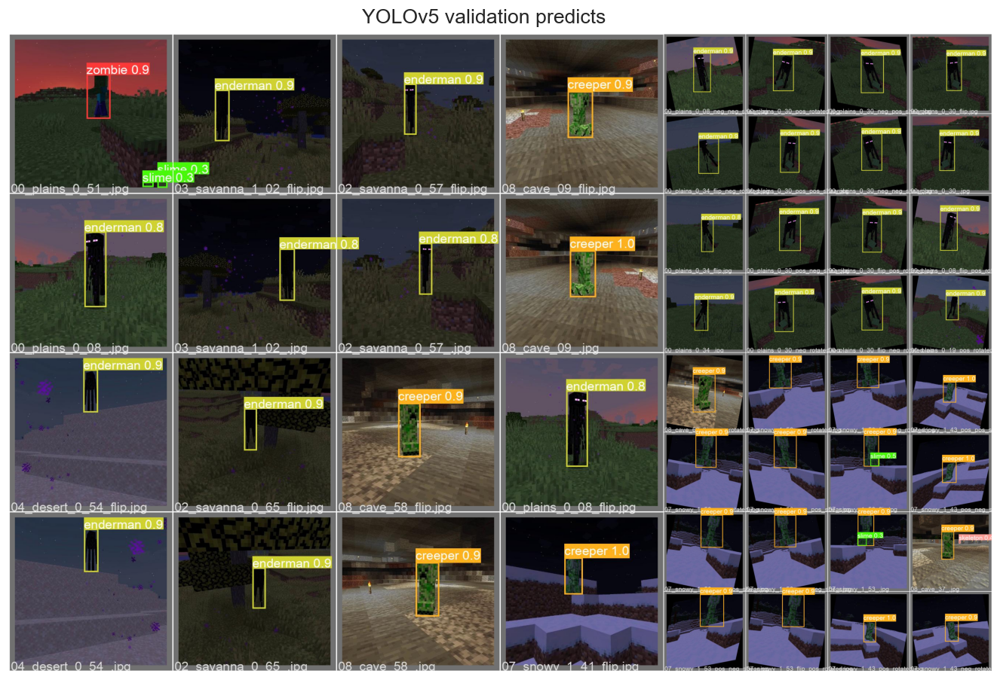

In [79]:
predict_batches = list((DIST_MODELS / 'yolov5/labeler/runs/train/exp').glob('val_batch?_pred.jpg'))
predict_plot = [utils.Image.open(i).data for i in predict_batches]

MOSAIC_3.plot(predict_plot, fig_width=FIG_WIDTH_XXL, title_kwargs={'title': 'YOLOv5 validation predicts', 'y': 0.91})

del predict_plot

In [13]:
import yolov5
from yolov5.models.common import Detections, AutoShape

In [14]:
def yolo_labeling(yolo: AutoShape, images_dir: Path, labels_dir: Path) -> List[str]:
    problems = []

    batch = 200
    images = list(images_dir.iterdir())
    for i in tqdm(range(0, len(images) + 1, batch)):
        detects: Detections = yolo(images[i:i + batch], size=IMG_SIZE_YOLO)
        for detection, fname in zip(detects.xywhn, detects.files):
            mob_idx = MOBS.index(fname.split('_')[1])
            detection = detection[detection[:, -1] == mob_idx]
            if len(detection):
                detection = detection[detection[:, -2].argsort(descending=True)]
                *bbox, _, cls = detection[0]
                label = utils.Label(int(cls), utils.BBox(*map(float, bbox)))
                label.save(labels_dir / Path(fname).with_suffix('.txt'))
            else:
                problems.append(fname)
                with open(labels_dir / Path(fname).with_suffix('.txt'), 'w'):
                    pass

    with open(labels_dir / 'classes.txt', 'w') as f:
        f.write('\n'.join(MOBS))

    return problems


In [15]:
yolo = yolov5.load(DIST_MODELS / 'yolov5/labeler/runs/train/exp/weights/best.pt')

In [16]:
problems = yolo_labeling(yolo, DATA_IMAGES_YOLO, DATA_LABELS)
utils.write_problems(DATA_PROBLEMS, problems)
problems

  0%|          | 0/19 [00:00<?, ?it/s]

['00_zombie_03_savanna_1_12.jpg',
 '02_spider_01_plains_1_00.jpg',
 '02_spider_01_plains_1_04.jpg',
 '02_spider_01_plains_1_05.jpg',
 '02_spider_01_plains_1_53.jpg',
 '02_spider_01_plains_1_63.jpg',
 '02_spider_02_savanna_0_44.jpg',
 '02_spider_02_savanna_0_69.jpg',
 '02_spider_02_savanna_0_70.jpg',
 '02_spider_06_snowy_0_28.jpg',
 '02_spider_07_snowy_1_63.jpg',
 '02_spider_07_snowy_1_64.jpg',
 '03_creeper_02_savanna_0_69.jpg',
 '04_enderman_02_savanna_0_68.jpg',
 '04_enderman_05_desert_1_18.jpg']

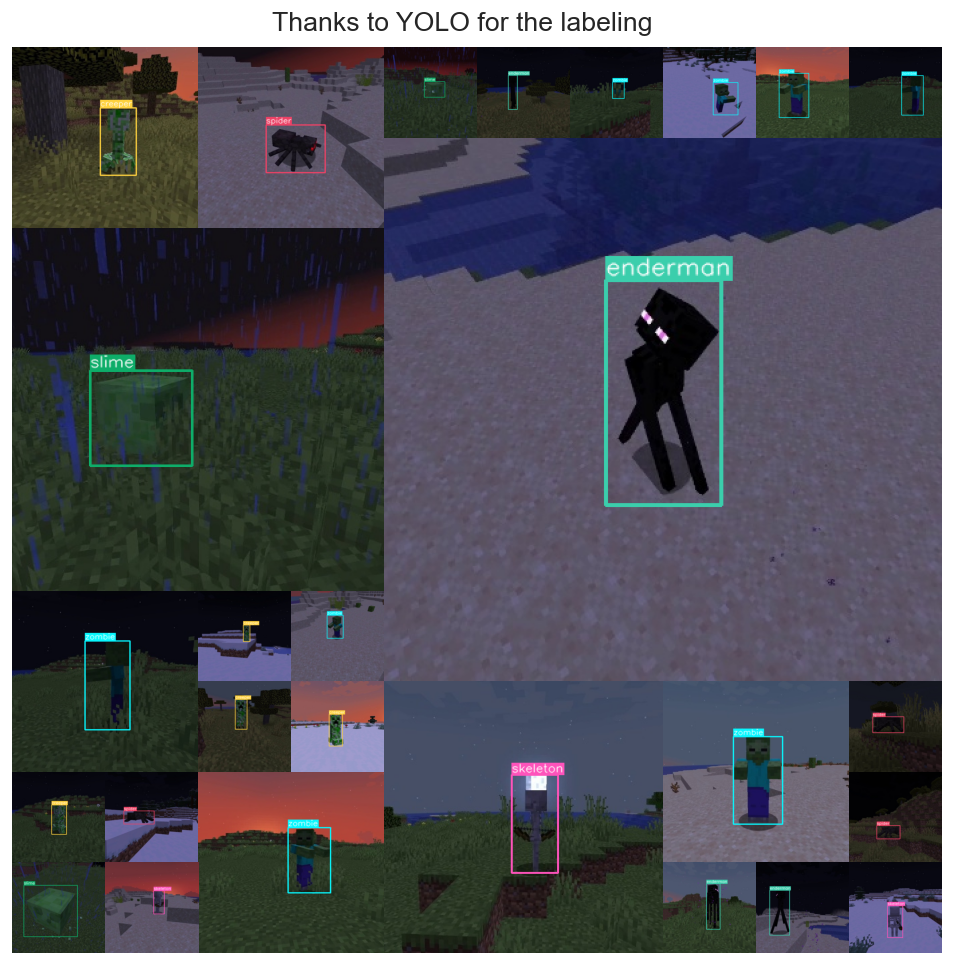

In [80]:
images_sample = sorted(DATA_IMAGES_YOLO.iterdir())
labels_sample = sorted(DATA_LABELS.iterdir())
mobs_sample = [f.name.split('_')[1] for f in images_sample]

sample = RANDOM.choice(
    list(zip(images_sample, labels_sample, mobs_sample)),
    size=MOSAIC_27.nimages,
    replace=False
)

sample_plot = []
for i, (img_path, label_path, mob) in enumerate(sample):
    img = utils.Image.open(img_path)
    label = utils.Label.open(label_path)
    sample_plot.append(utils.visualize_bbox(img.data, label.bbox, mob, color=COLOR_PALETTE.get(mob)))

MOSAIC_27.plot(sample_plot, fig_width=FIG_WIDTH_L, title_kwargs={'title': 'Thanks to YOLO for the labeling', 'y': 0.91})

del sample_plot

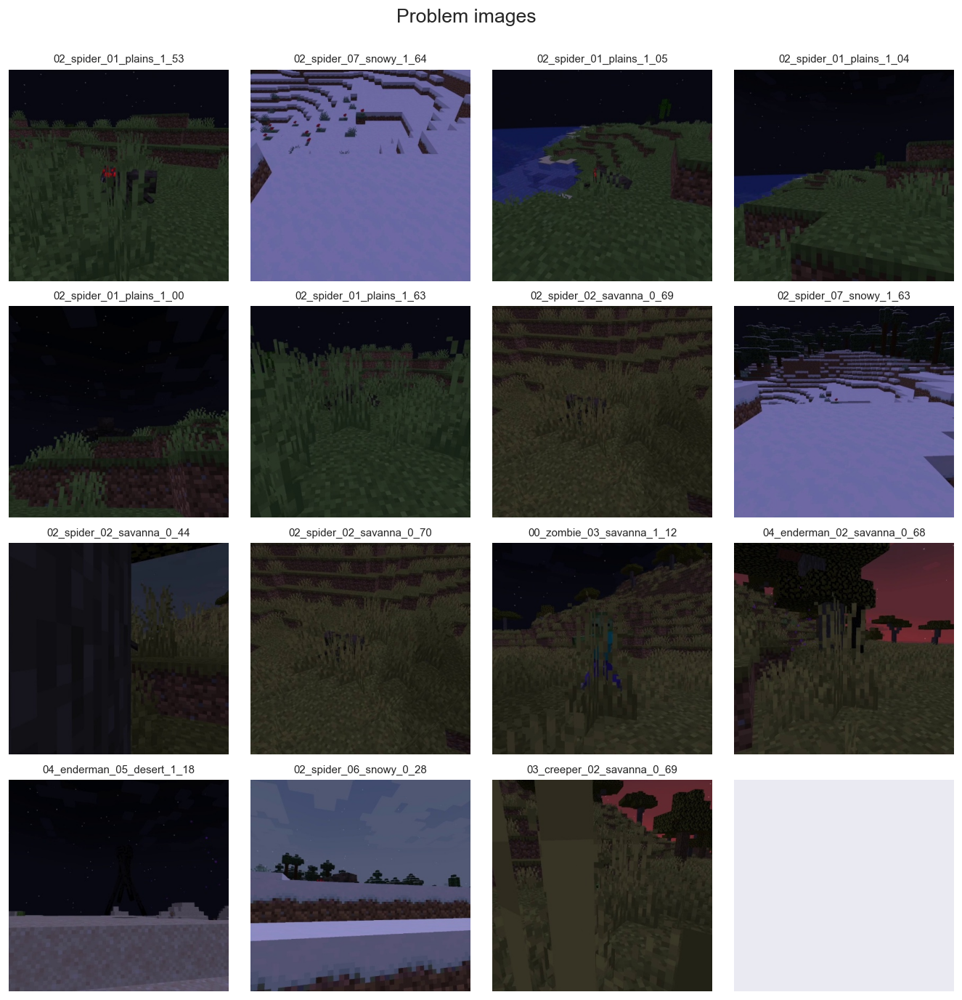

In [83]:
problem_images = [
    utils.Image.open(DATA_IMAGES_YOLO / p).data
    for p in problems
]

nrows, ncols = 4, 4
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(FIG_WIDTH_XXL, FIG_WIDTH_XXL / (ncols / nrows)))
fig.subplots_adjust(hspace=0.12, wspace=0.1)
fig.suptitle('Problem images', y=0.93)
for i, image in enumerate(problem_images):
    row = i // ncols
    col = i % ncols
    ax: Axes = axes[row, col]
    utils.reset_axes(ax)
    ax.set_title(problems[i][:-4], size=9)

    ax.imshow(image, aspect='auto')

utils.reset_axes(axes[3, 3])

del problem_images

# Задача классификации

In [5]:
from sklearn.base import BaseEstimator, TransformerMixin
from skimage.feature import hog
import pandas as pd
import warnings
from contexttimer import Timer
from sklearn.exceptions import ConvergenceWarning, UndefinedMetricWarning
from skimage.color import rgb2gray
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, GridSearchCV
# from sklearn.semi_supervised import SelfTrainingClassifier
# from sklearn.calibration import CalibratedClassifierCV
# from sklearn.ensemble import StackingClassifier, VotingClassifier
# from sklearn.multiclass import OutputCodeClassifier, OneVsRestClassifier, OneVsOneClassifier
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn import metrics
from sklearn.pipeline import Pipeline

In [6]:
from sklearn.svm import SVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier, ExtraTreeClassifier
from sklearn.linear_model import (
    LogisticRegression,
    SGDClassifier,
    RidgeClassifier,
    PassiveAggressiveClassifier
)
from sklearn.ensemble import (
    RandomForestClassifier,
    ExtraTreesClassifier,
    AdaBoostClassifier,
    GradientBoostingClassifier
)

In [7]:
problems = set(utils.load_problems(DATA_PROBLEMS))
TIDY_IMAGE_NAMES = [f.stem for f in DATA_IMAGES_ORIG.iterdir() if f.name not in problems]
len(TIDY_IMAGE_NAMES)

3772

## Локализация классов

In [8]:
min_max_bbox_labels = []
for name in TIDY_IMAGE_NAMES:
    label = utils.Label.open((DATA_LABELS / name).with_suffix('.txt'))
    *_, w, h = label.bbox.xywhn
    a = max(w, h)
    min_max_bbox_labels.append((a, label))

min_max_bbox_labels = sorted(min_max_bbox_labels, key=lambda x: x[0])

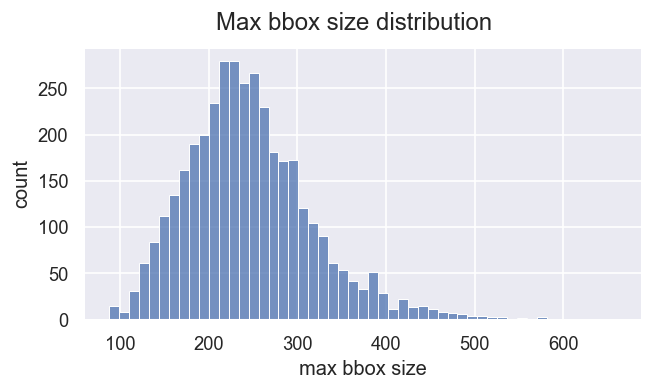

In [9]:
fig, ax = plt.subplots(figsize=(6, 3))
ax = sns.histplot(x=np.array([i[0] for i in min_max_bbox_labels]) * IMG_SIZE_ORIG, ax=ax)
fig.suptitle('Max bbox size distribution')
ax.set_xlabel('max bbox size')
ax.set_ylabel('count');

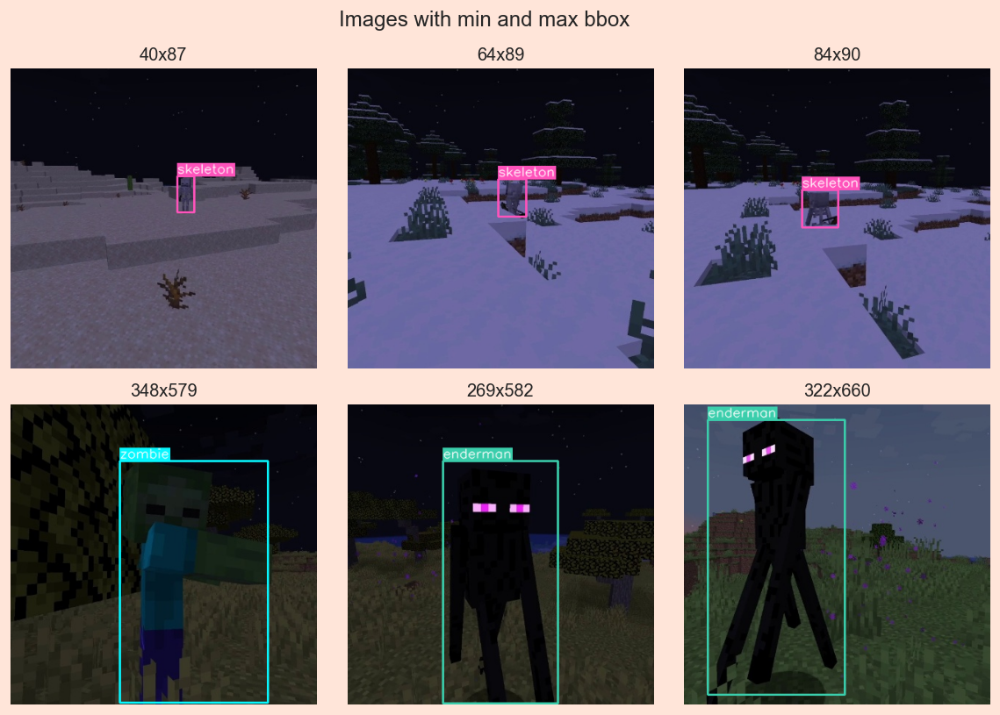

In [10]:
min_max_bbox_labels_sample = [*min_max_bbox_labels[:3], *min_max_bbox_labels[-3:]]

sample_plot = []
for _, label in min_max_bbox_labels_sample:
    name = label.path.name
    mob = name.split('_')[1]
    img = utils.Image.open((DATA_IMAGES_YOLO / name).with_suffix('.jpg'))

    *_, w, h = label.bbox.xywhn
    sample_plot.append((
        f'{int(w * IMG_SIZE_ORIG)}x{int(h * IMG_SIZE_ORIG)}',
        utils.visualize_bbox(img.data, label.bbox, mob, color=COLOR_PALETTE.get(mob)),
    ))

nrows, ncols = 2, 3
fig, axes = plt.subplots(
    nrows=nrows,
    ncols=ncols,
    figsize=(FIG_WIDTH_XL, FIG_WIDTH_XL / (ncols / nrows)),
    facecolor='#ffe5d9'
)
fig.subplots_adjust(hspace=0.12, wspace=0.1)
fig.suptitle('Images with min and max bbox', y=0.95)
for i, (title, image) in enumerate(sample_plot):
    row = i // ncols
    col = i % ncols
    ax: Axes = axes[row, col]
    utils.reset_axes(ax)
    text = ax.set_title(title, size=12)

    ax.imshow(image, aspect='auto')

del sample_plot

In [9]:
TARGET_SIZE = 40  # 96

In [10]:
# https://blog.roboflow.com/you-might-be-resizing-your-images-incorrectly/#how-should-i-fill-padding-pixels
# https://forums.fast.ai/t/partial-convergence-padding-vs-reflection-zero-etc/43508

In [11]:
dataset = {'images': [], 'target': []}

for name in tqdm(TIDY_IMAGE_NAMES):
    img = utils.Image.open((DATA_IMAGES_ORIG / name).with_suffix('.jpg'))
    label = utils.Label.open((DATA_LABELS / name).with_suffix('.txt'))
    new_img = cv2.resize(utils.crop_bbox_rect(img.data, label.bbox, pad=2), (TARGET_SIZE, TARGET_SIZE))
    dataset['images'].append(new_img)
    dataset['target'].append(label.cls)

dataset['images'] = np.array(dataset['images'], dtype='uint8')
dataset['data'] = dataset['images'].reshape(dataset['images'].shape[0], -1)
dataset['target'] = np.array(dataset['target'], dtype='uint8')

  0%|          | 0/3772 [00:00<?, ?it/s]

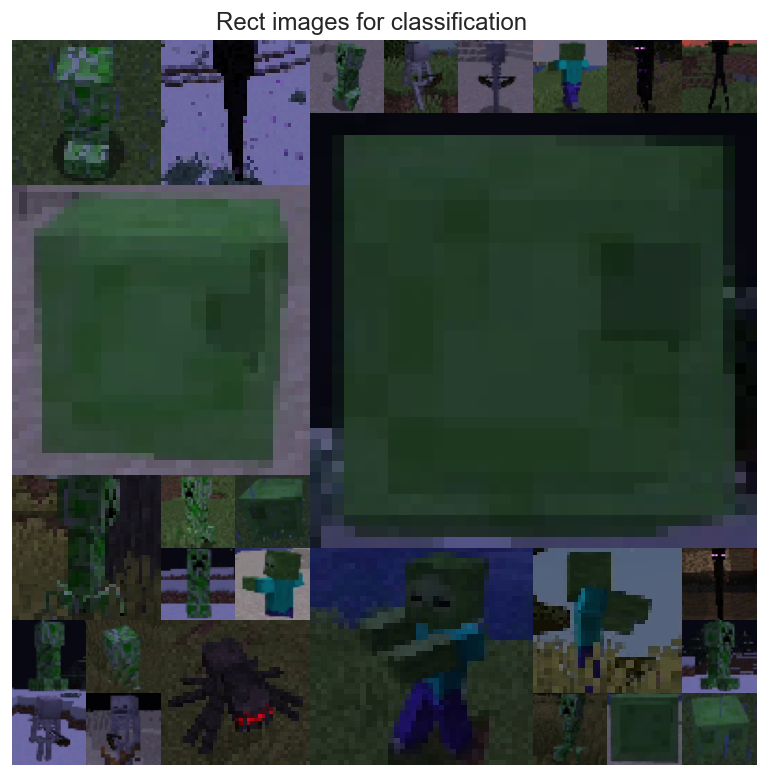

In [14]:
MOSAIC_27.plot(
    RANDOM.choice(dataset['images'], size=MOSAIC_27.nimages, replace=False),
    fig_width=FIG_WIDTH_M,
    title_kwargs={'title': 'Rect images for classification', 'y': 0.91}
)

## Описательный анализ

In [12]:
print(
    f'Classes: {len(np.unique(dataset["target"]))}\n'
    f'Samples total: {len(dataset["target"])}\n'
    f'Features: {dataset["data"].shape[1]} (int, {dataset["data"].min()}..{dataset["data"].max()})\n'
    f'Image size: {" x ".join(map(str, dataset["images"][0].shape))}'
)

Classes: 6
Samples total: 3772
Features: 4800 (int, 0..255)
Image size: 40 x 40 x 3


In [12]:
X = dataset['images']
y = dataset['target']

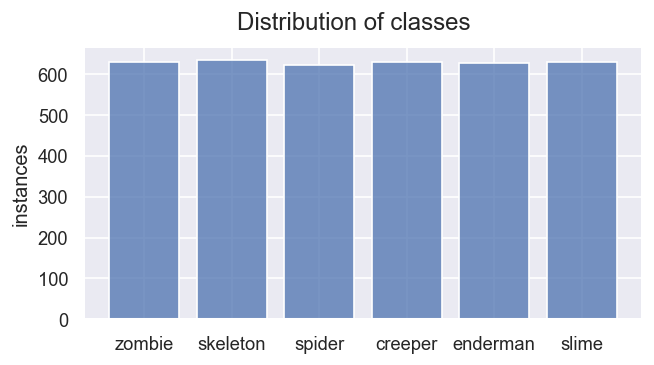

In [28]:
data = [MOBS[i] for i in y]
ax: Axes = sns.histplot(x=data, shrink=0.8, hue_order=MOBS)
ax.figure.set_size_inches(6, 3)
ax.set_ylabel('instances')
ax.figure.suptitle('Distribution of classes');

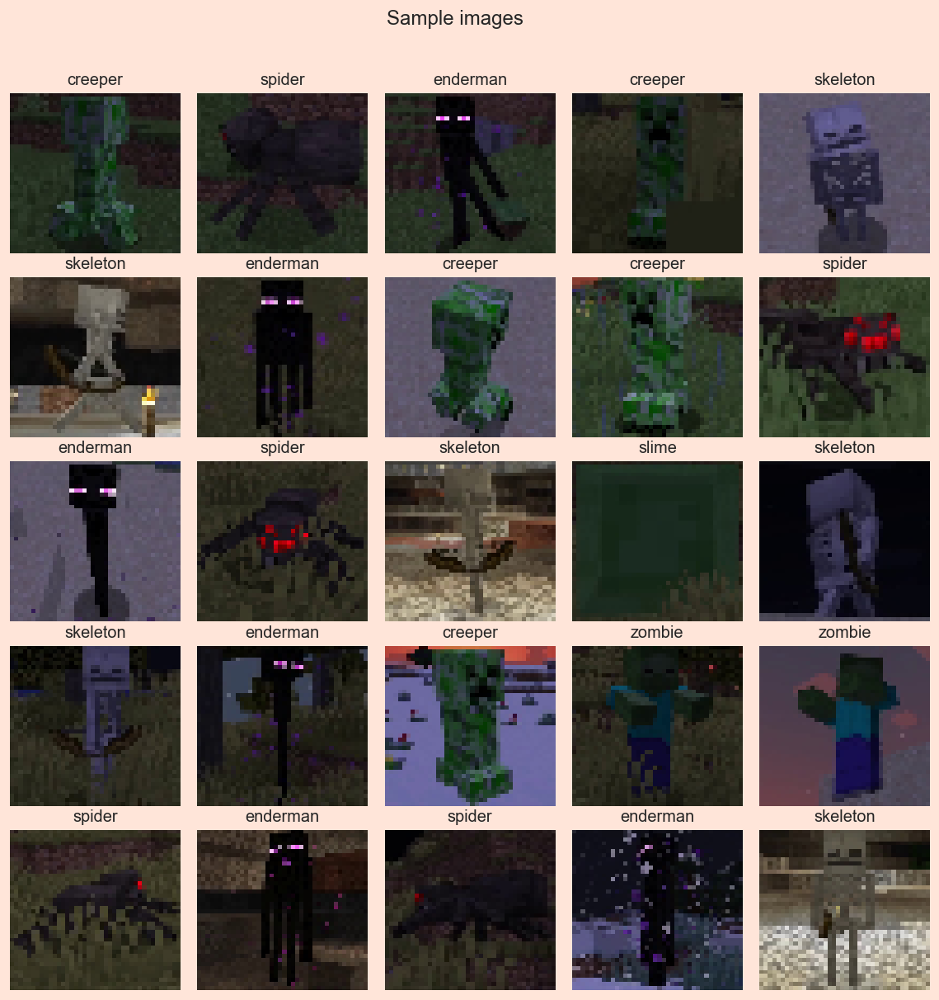

In [29]:
nrows, ncols = 5, 5
fig, axes = plt.subplots(
    nrows=nrows,
    ncols=ncols,
    figsize=(FIG_WIDTH_XL, FIG_WIDTH_XL / (ncols / nrows)),
    facecolor='#ffe5d9'
)
fig.subplots_adjust(hspace=0.15, wspace=0.1)
fig.suptitle('Sample images', y=0.95)
for i, j in enumerate(RANDOM.integers(len(dataset['target']), size=nrows * ncols)):
    cls = dataset['target'][j]
    img = dataset['images'][j]

    row = i // ncols
    col = i % ncols
    ax: Axes = axes[row, col]
    utils.reset_axes(ax)
    text = ax.set_title(MOBS[cls], size=12)

    ax.imshow(img, aspect='auto')


## Классические модели

In [13]:
X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=True, test_size=0.2, random_state=0)

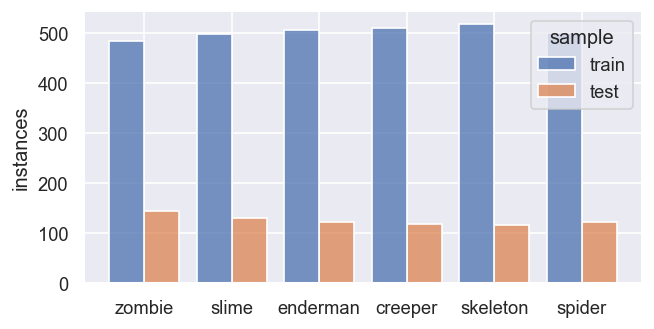

In [20]:
df_train = pd.DataFrame(y_train, columns=['cls'])
df_train['sample'] = 'train'
df_test = pd.DataFrame(y_test, columns=['cls'])
df_test['sample'] = 'test'
data = pd.concat([df_train, df_test], ignore_index=True)
data['cls'] = data['cls'].map(lambda x: MOBS[x])

ax: Axes = sns.histplot(data=data, x='cls', hue='sample', multiple='dodge', shrink=0.8)
ax.figure.set_size_inches(6, 3)
ax.set_xlabel('')
ax.set_ylabel('instances');

In [14]:
class Flatter(BaseEstimator, TransformerMixin):

    def __init__(self):
        pass

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        return X.reshape(X.shape[0], -1)


In [15]:
flatter = Flatter()
X_train_ = flatter.fit_transform(X_train)
X_test_ = flatter.transform(X_test)

clf = LogisticRegression(max_iter=500)

In [16]:
% % timeit -n 1 -r 1

clf.fit(X_train_, y_train)

13.7 s ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


In [17]:
with Timer(output=True, fmt='{:.4f} s') as t:
    y_pred = clf.predict(X_test_)

 0.0101 s


In [18]:
y_pred_proba = clf.predict_proba(X_test_)

In [19]:
print(metrics.classification_report(y_test, y_pred, digits=3, target_names=MOBS, zero_division=0))

              precision    recall  f1-score   support

      zombie      0.993     0.993     0.993       145
    skeleton      1.000     0.991     0.996       116
      spider      0.984     0.984     0.984       122
     creeper      1.000     0.983     0.992       119
    enderman      0.976     0.992     0.984       122
       slime      0.992     1.000     0.996       131

    accuracy                          0.991       755
   macro avg      0.991     0.991     0.991       755
weighted avg      0.991     0.991     0.991       755



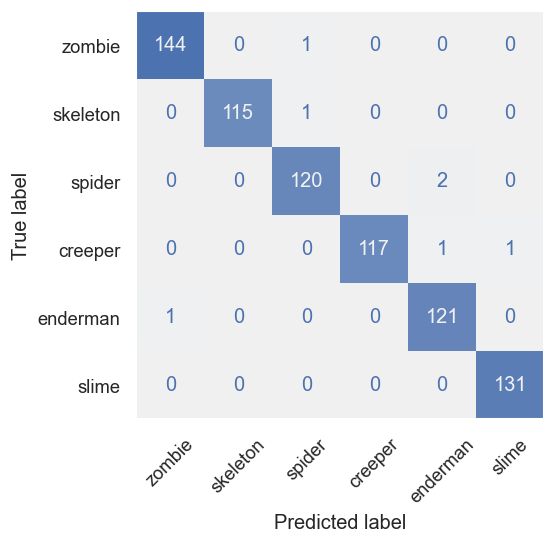

In [20]:
cm_display = metrics.ConfusionMatrixDisplay.from_predictions(
    y_test,
    y_pred,
    display_labels=MOBS,
    colorbar=False,
    xticks_rotation=45,
    cmap=sns.color_palette('light:b', as_cmap=True)
)
cm_display.ax_.grid(False)
cm_display.figure_.set_size_inches(4.5, 4.5)

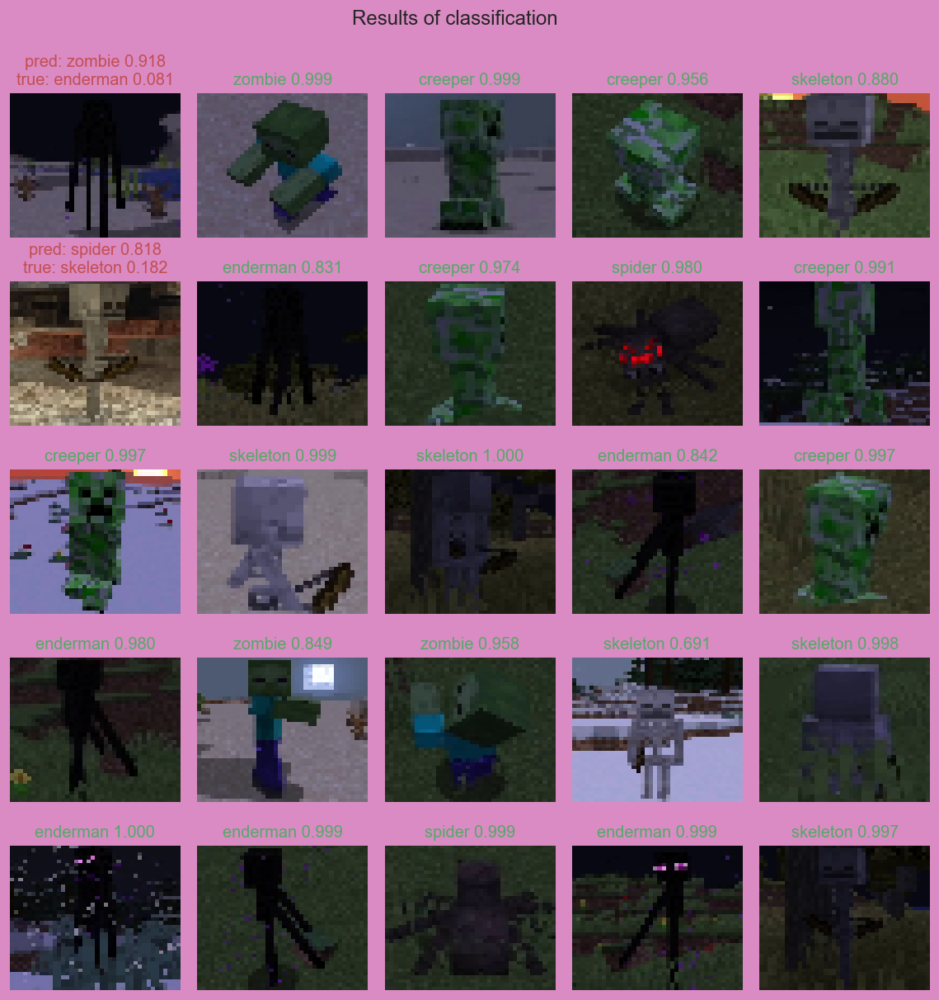

In [140]:
df = pd.DataFrame(y_pred_proba)
worst_proba = df.iloc[df.max(axis=1).argsort()][:40].index

nrows, ncols = 5, 5
fig, axes = plt.subplots(
    nrows=nrows,
    ncols=ncols,
    figsize=(FIG_WIDTH_XL, FIG_WIDTH_XL / (ncols / nrows)),
    facecolor=sns.color_palette('deep')[-4]
)
fig.subplots_adjust(hspace=0.3, wspace=0.1)
fig.suptitle('Results of classification', y=0.95)
for i, j in enumerate(RANDOM.choice(worst_proba, size=nrows * ncols, replace=False)):
    cls_true = y_test[j]
    cls_pred = y_pred[j]
    prob = y_pred_proba[j]
    if cls_true == cls_pred:
        color = sns.color_palette('deep')[2]
        title = f'{MOBS[cls_pred]} {prob.max():.3f}'
    else:
        color = sns.color_palette('deep')[3]
        title = (f'pred: {MOBS[cls_pred]} {prob.max():.3f}\n'
                 f'true: {MOBS[cls_true]} {prob[cls_true]:.3f}')

    img = X_test[j]

    row = i // ncols
    col = i % ncols
    ax: Axes = axes[row, col]
    utils.reset_axes(ax)
    text = ax.set_title(title, size=12, fontdict={'color': color})

    ax.imshow(img, aspect='auto')

del worst_proba

In [137]:
def search_report(cv_results: Dict) -> pd.DataFrame:
    report = pd.DataFrame(cv_results).sort_values('rank_test_accuracy')[[
        'params',
        'mean_fit_time',
        'mean_score_time',
        'mean_test_accuracy',
        'mean_test_precision_weighted',
        'mean_test_recall_weighted',
        'mean_test_f1_weighted',
    ]].copy()
    report = report.rename(columns=lambda x: x.replace('mean_', '').replace('test_', '').replace('_weighted', ''))
    report['params'] = report['params'].apply(lambda x: '__'.join(map(str, reversed(list(x.values())))))
    return report


In [138]:
simple_pipline = Pipeline([
    ('flatter', Flatter()),
    ('scaler', MinMaxScaler()),
    ('clf', LogisticRegression(max_iter=500, random_state=0)),
])

In [32]:
classic_param_grid = [{
    'clf': [
        LogisticRegression(max_iter=500, random_state=0),
        KNeighborsClassifier(),
        MultinomialNB(),
        DecisionTreeClassifier(random_state=0),
        ExtraTreeClassifier(random_state=0),
        SVC(),
        SVC(kernel='linear'),
        PassiveAggressiveClassifier(random_state=0),
    ]
}, {
    'scaler': [StandardScaler()],
    'clf': [MLPClassifier(random_state=0)],
}]

classic_search = GridSearchCV(
    simple_pipline,
    classic_param_grid,
    scoring=['accuracy', 'precision_weighted', 'recall_weighted', 'f1_weighted'],
    refit='accuracy',
    cv=2,
    verbose=4,
    n_jobs=4,
)

if __name__ == '__main__':
    with warnings.catch_warnings():
        warnings.simplefilter('ignore', category=ConvergenceWarning)
        warnings.simplefilter('ignore', category=UndefinedMetricWarning)
        classic_search.fit(X_train, y_train)

Fitting 2 folds for each of 9 candidates, totalling 18 fits


In [34]:
search_report(classic_search.cv_results_)

,params,fit_time,score_time,accuracy,precision,recall,f1
8,StandardScaler()__MLPClassifier(random_state=0),11.060651,0.095510,0.992709,0.992769,0.992709,0.992704
0,"LogisticRegression(max_iter=500, random_state=0)",19.320646,0.173069,0.992377,0.992443,0.992377,0.992378
6,SVC(kernel='linear'),3.406918,3.580552,0.992045,0.992103,0.992045,0.992048
7,PassiveAggressiveClassifier(random_state=0),3.913997,0.095369,0.991382,0.991449,0.991382,0.991386
5,SVC(),10.208254,12.376254,0.990388,0.990452,0.990388,0.990387
1,KNeighborsClassifier(),0.193302,0.786201,0.882000,0.890982,0.882000,0.879233
3,DecisionTreeClassifier(random_state=0),5.017305,0.104556,0.862114,0.864128,0.862114,0.862199
4,ExtraTreeClassifier(random_state=0),0.257755,0.309748,0.779582,0.780766,0.779582,0.780022
2,MultinomialNB(),0.202866,0.111907,0.778251,0.796623,0.778251,0.778532


## Оптимизации классических моделей

In [35]:
optimized_param_grid = [{
    'clf': [
        RidgeClassifier(random_state=0),
        SGDClassifier(random_state=0),
    ]
}]

optimized_search = GridSearchCV(
    simple_pipline,
    optimized_param_grid,
    scoring=['accuracy', 'precision_weighted', 'recall_weighted', 'f1_weighted'],
    refit='accuracy',
    cv=3,
    verbose=4,
    n_jobs=4,
)

if __name__ == '__main__':
    with warnings.catch_warnings():
        warnings.simplefilter('ignore', category=ConvergenceWarning)
        warnings.simplefilter('ignore', category=UndefinedMetricWarning)
        optimized_search.fit(X_train, y_train)

Fitting 3 folds for each of 2 candidates, totalling 6 fits


In [36]:
search_report(optimized_search.cv_results_)

,params,fit_time,score_time,accuracy,precision,recall,f1
1,SGDClassifier(random_state=0),1.716837,0.038079,0.981771,0.981978,0.981771,0.981760
0,RidgeClassifier(random_state=0),1.522291,0.069917,0.961220,0.961543,0.961220,0.961262


## Ансамблирование моделей

In [ ]:
# https://12ft.io/proxy?q=https://towardsdatascience.com/battle-of-the-ensemble-random-forest-vs-gradient-boosting-6fbfed14cb7


In [40]:
ensemble_param_grid = [{
    'clf': [
        # bagging
        RandomForestClassifier(random_state=0),
        ExtraTreesClassifier(random_state=0),

        # boosting
        AdaBoostClassifier(n_estimators=10, random_state=0),
        GradientBoostingClassifier(n_estimators=10, random_state=0),
    ]
}]

ensemble_search = GridSearchCV(
    simple_pipline,
    ensemble_param_grid,
    scoring=['accuracy', 'precision_weighted', 'recall_weighted', 'f1_weighted'],
    refit='accuracy',
    cv=2,
    verbose=4,
)

if __name__ == '__main__':
    with warnings.catch_warnings():
        warnings.simplefilter('ignore', category=ConvergenceWarning)
        warnings.simplefilter('ignore', category=UndefinedMetricWarning)
        ensemble_search.fit(X_train, y_train)

Fitting 2 folds for each of 4 candidates, totalling 8 fits
[CV 1/2] END clf=RandomForestClassifier(random_state=0); accuracy: (test=0.988) f1_weighted: (test=0.988) precision_weighted: (test=0.988) recall_weighted: (test=0.988) total time=   3.5s
[CV 2/2] END clf=RandomForestClassifier(random_state=0); accuracy: (test=0.989) f1_weighted: (test=0.989) precision_weighted: (test=0.989) recall_weighted: (test=0.989) total time=   3.5s
[CV 1/2] END clf=ExtraTreesClassifier(random_state=0); accuracy: (test=0.995) f1_weighted: (test=0.995) precision_weighted: (test=0.995) recall_weighted: (test=0.995) total time=   1.6s
[CV 2/2] END clf=ExtraTreesClassifier(random_state=0); accuracy: (test=0.996) f1_weighted: (test=0.996) precision_weighted: (test=0.996) recall_weighted: (test=0.996) total time=   1.5s
[CV 1/2] END clf=AdaBoostClassifier(n_estimators=10, random_state=0); accuracy: (test=0.333) f1_weighted: (test=0.248) precision_weighted: (test=0.273) recall_weighted: (test=0.333) total time=

In [41]:
search_report(ensemble_search.cv_results_)

,params,fit_time,score_time,accuracy,precision,recall,f1
1,ExtraTreesClassifier(random_state=0),1.523260,0.100412,0.995360,0.995379,0.995360,0.995356
0,RandomForestClassifier(random_state=0),3.488985,0.090009,0.988399,0.988525,0.988399,0.988408
3,"GradientBoostingClassifier(n_estimators=10, ra...",64.618438,0.064495,0.947300,0.948120,0.947300,0.947398
2,"AdaBoostClassifier(n_estimators=10, random_sta...",4.027785,0.229474,0.333444,0.270645,0.333444,0.244367


In [96]:
print(metrics.classification_report(y_test, simple_pipline.predict(X_test), zero_division=False))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       145
           1       1.00      0.98      0.99       116
           2       0.99      1.00      1.00       122
           3       1.00      0.99      1.00       119
           4       0.99      0.99      0.99       122
           5       0.98      1.00      0.99       131

    accuracy                           0.99       755
   macro avg       0.99      0.99      0.99       755
weighted avg       0.99      0.99      0.99       755



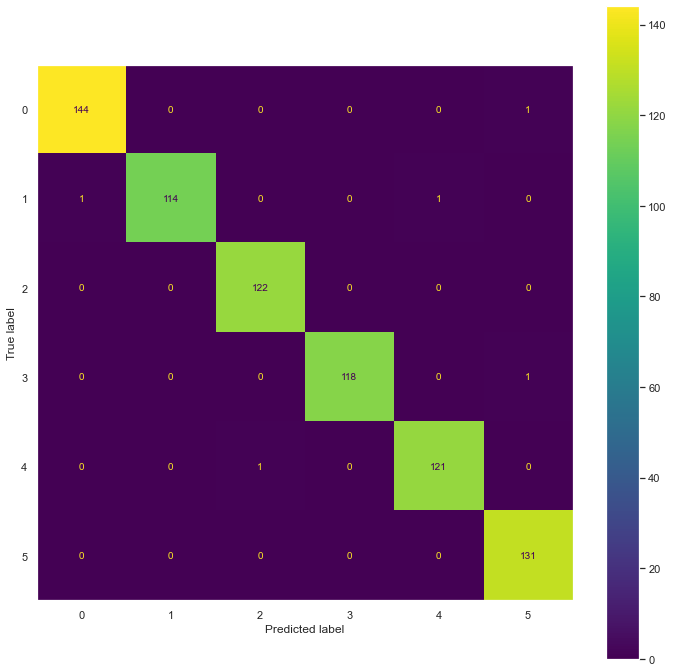

In [97]:
_, ax = plt.subplots(figsize=(12, 12))
ax.grid(False)
metrics.ConfusionMatrixDisplay.from_predictions(y_test, simple_pipline.predict(X_test), ax=ax)

## Уменьшение размерности

In [517]:
img = dataset['images'][0]

# grayscale
gray_img = rgb2gray(img)

# HOG
_, hog_img = hog(
    gray_img,
    visualize=True,
    orientations=9,
    pixels_per_cell=(6, 6),
    cells_per_block=(4, 4),
    block_norm='L2-Hys'
)

# PCA
n_components = 100
pca = PCA(n_components=n_components, whiten=True)
pca.fit(rgb2gray(X_train.reshape(X_train.shape[0], TARGET_SIZE, TARGET_SIZE, 3)).reshape(X_train.shape[0], -1))
pca_img = pca.components_.reshape(pca.n_components_, TARGET_SIZE, TARGET_SIZE)

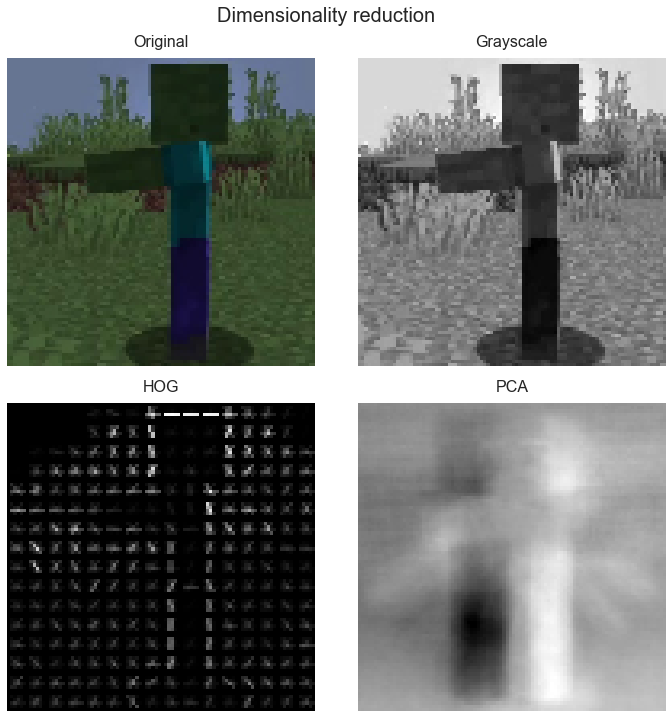

In [518]:
images_sample = [img, gray_img, hog_img, pca_img[5]]
titles = ['Original', 'Grayscale', 'HOG', 'PCA']

nrows, ncols = 2, 2
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, 12 / (ncols / nrows)))
fig.subplots_adjust(hspace=0.12, wspace=0.1)
fig.suptitle('Dimensionality reduction', y=0.94)
for i, image in enumerate(images_sample):
    row = i // ncols
    col = i % ncols
    ax = axes[row, col]
    utils.reset_axes(ax)
    ax.set_title(titles[i], pad=12, fontdict={'size': 16})
    ax.imshow(image, cmap='gray' if len(image.shape) == 2 else None)

In [532]:
class Resizer(BaseEstimator, TransformerMixin):

    def __init__(self, w: int, h: int):
        self.w = w
        self.h = h

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        return np.array([cv2.resize(img, (self.w, self.h)) for img in X])


class RGB2GrayTransformer(BaseEstimator, TransformerMixin):

    def __init__(self, w: int, h: int):
        self.w = w
        self.h = h

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        X = rgb2gray(X.reshape(X.shape[0], self.h, self.w, 3))
        return X.reshape(X.shape[0], -1)


class HogTransformer(BaseEstimator, TransformerMixin):

    def __init__(self, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(3, 3), block_norm='L2-Hys'):
        self.orientations = orientations
        self.pixels_per_cell = pixels_per_cell
        self.cells_per_block = cells_per_block
        self.block_norm = block_norm

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        def _hog(img):
            img = img.reshape(TARGET_SIZE, TARGET_SIZE)
            return hog(
                img,
                orientations=self.orientations,
                pixels_per_cell=self.pixels_per_cell,
                cells_per_block=self.cells_per_block,
                block_norm=self.block_norm,
            )

        return np.array([_hog(img) for img in X])


In [533]:
reduce_dim_pipline = Pipeline([
    ('grayscale', RGB2GrayTransformer(TARGET_SIZE, TARGET_SIZE)),
    ('reduce_dim', HogTransformer()),
    ('scaler', StandardScaler()),
    ('clf', SGDClassifier()),
])

In [534]:
% % timeit -n 1 -r 1

reduce_dim_pipline.fit(X_train, y_train)

15.1 s ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


In [535]:
print(metrics.classification_report(y_test, reduce_dim_pipline.predict(X_test)))

              precision    recall  f1-score   support

           0       0.98      0.95      0.97       145
           1       0.97      0.97      0.97       116
           2       0.99      1.00      1.00       122
           3       0.99      0.97      0.98       119
           4       0.98      1.00      0.99       122
           5       0.98      1.00      0.99       131

    accuracy                           0.98       755
   macro avg       0.98      0.98      0.98       755
weighted avg       0.98      0.98      0.98       755



In [492]:
print(metrics.classification_report(y_test, reduce_dim_pipline.predict(X_test)))

              precision    recall  f1-score   support

           0       0.94      0.92      0.93       145
           1       0.88      0.80      0.84       116
           2       0.88      0.98      0.93       122
           3       0.92      0.86      0.89       119
           4       0.93      0.93      0.93       122
           5       0.91      0.97      0.94       131

    accuracy                           0.91       755
   macro avg       0.91      0.91      0.91       755
weighted avg       0.91      0.91      0.91       755



In [ ]:
!rm -rf / content / sample_data
!rm -rf / content / ml-obj-detection-classification-prob

In [ ]:
% cd / content /
!git clone 'https://github.com/belo4ya/ml-obj-detection-classification-prob.git' '/content/ml-obj-detection-classification-prob'
% cd / content / ml-obj-detection-classification-prob
% pip install -q -r requirements / colab.txt